<a href="https://colab.research.google.com/github/jjjjhs/project_cnn_diffusion/blob/deeplabv3/DeepLabV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colab 세팅 셀 (필수 라이브러리 + GPU 확인)

In [ ]:
# ✅ 필수 라이브러리 설치 (처음 1번만 실행)
!pip install torch torchvision tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
# 1. 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
import random
from sklearn.model_selection import train_test_split
import torch
import time
import numpy as np
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from itertools import product
import pickle
import pandas as pd

# ✅ 경로 설정
image_dir = r"/content/drive/MyDrive/1920_1080_image"
mask_dir = r"/content/drive/MyDrive/1920_1080_mask"

all_images = [f for f in os.listdir(image_dir) if f.endswith((".jpg", ".png"))]
all_images.sort()
random.seed(42)
random.shuffle(all_images)

# 70:20:10 비율로 나누기 (scikit-learn 활용)
train_val_imgs, test_imgs = train_test_split(all_images, test_size=0.1, random_state=42)
train_imgs, val_imgs = train_test_split(train_val_imgs, test_size=2/9, random_state=42)  # 2/9 of 90% ≈ 20%

# 검증
print(f"Train: {len(train_imgs)}, Val: {len(val_imgs)}, Test: {len(test_imgs)}")

Train: 2146, Val: 614, Test: 307


In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import numpy as np
import os
import torchvision.transforms as T
import torch

class SegmentationDataset(Dataset):
    def __init__(self, file_list, image_dir, mask_dir, transform=None):
        self.file_list = file_list
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        fname = self.file_list[idx]
        img_path = os.path.join(self.image_dir, fname)
        mask_path = os.path.join(self.mask_dir, os.path.splitext(fname)[0] + "_mask.png")

        # RGB 이미지 로드
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        # 마스크는 PIL로 열고 -> np.array로 변환 -> 전처리 -> tensor 변환
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize((960, 540))  # 원하는 크기로 리사이즈
        mask = np.array(mask)
        mask = (mask > 0).astype(np.uint8)  # 이진 마스크화
        mask = torch.from_numpy(mask).long()  # tensor로 변환 후 long 타입

        return image, mask

In [ ]:
# ✅ 변환 정의
# 좌우 반전, 밝기/채도 변화, 회전 -> 학습 일반화
transform = T.Compose([
    T.Resize((540, 960)),
    T.ToTensor()
])

train_dataset = SegmentationDataset(train_imgs, image_dir, mask_dir, transform)
val_dataset = SegmentationDataset(val_imgs, image_dir, mask_dir, transform)
test_dataset = SegmentationDataset(test_imgs, image_dir, mask_dir, transform)

In [ ]:
# ✅ 실험할 하이퍼파라미터 조합
lr = 0.0001
weight = [1.0, 5.0]
batch_size = 4
num_epochs = 50

from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

# 모델 준비: DeepLabV3 모델 사용(백본: ResNet50)
model = models.segmentation.deeplabv3_resnet50(weights=models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT)
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1) # 클래스 수: 2(차선/차선아닌영역) (출력 채널 2개)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # gpu 사용 못하면 cpu
model = model.to(device)

# Adam 옵티마이저 사용
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
# ReduceLROnPlateau: val loss 기준으로 자동 학습률 감소
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5, verbose=True)

# 손실 함수: CrossEntropy + Dice Loss -> 픽셀 단위 정확도와 세그멘테이션 경계 정확도를 동시에
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.softmax(inputs, dim=1)[:,1,:,:]  # class=1만 추출 -> 차선에 대해서만 Dice 적
        targets = (targets == 1).float()
        intersection = (inputs * targets).sum()
        union = inputs.sum() + targets.sum()
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice

dice_loss = DiceLoss()
loss_fn = lambda outputs, masks: 0.3 * nn.CrossEntropyLoss(weight=torch.tensor(weight, dtype=torch.float).to(device))(outputs, masks) + \
                                 0.7 * dice_loss(outputs, masks)

# Early Stopping 설정 (10회 이상 loss가 더 작은 값이 안 나오면 학습 중단)
best_val_loss = float('inf')
patience = 10
counter = 0

# 로그 저장 리스트(학습 과정 추적용)
train_loss_history = []
val_loss_history = []

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:02<00:00, 74.9MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


<ipython-input-14-8d9fa14e8569>:10: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


✅ 체크포인트 로드 완료: 14 epoch부터 이어서 학습합니다.


Epoch 15 - Train:   0%|          | 0/537 [00:00<?, ?it/s]<ipython-input-14-8d9fa14e8569>:41: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 15 - Validation: 100%|██████████| 154/154 [06:32<00:00,  2.55s/it]


Epoch 15 - Train Loss: 0.0418 - Val Loss: 0.1455
⏹️ Early stopping at epoch 15


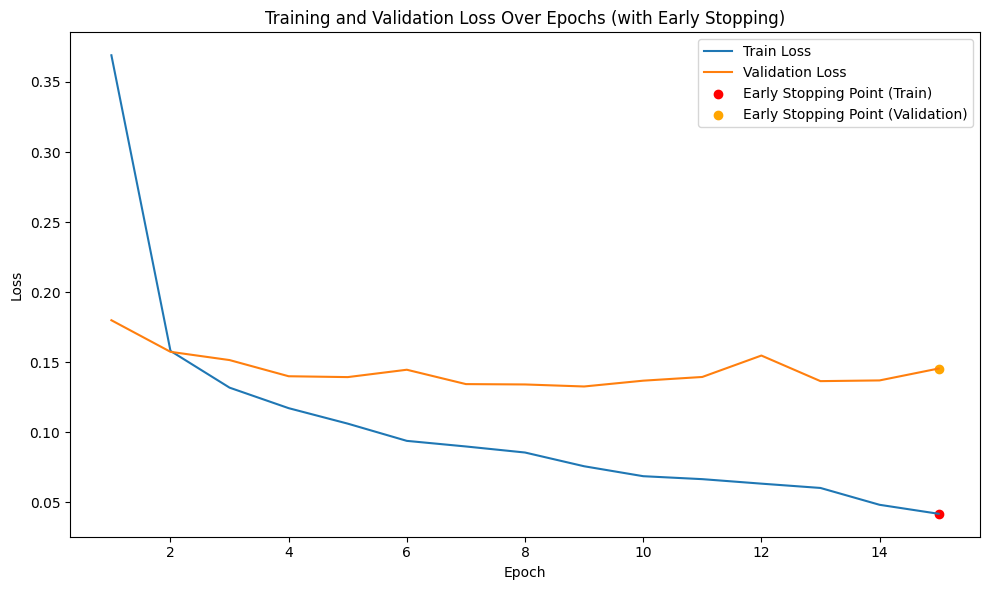

✅ 모델 저장 완료!


In [ ]:
import os
import pickle
import torch
from torch.cuda.amp import GradScaler, autocast
import matplotlib.pyplot as plt
from tqdm import tqdm

# ⛏️ 사전 준비
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scaler = GradScaler()
checkpoint_path = "/content/drive/MyDrive/swProject/checkpoint.pth"

# 🧱 상태 변수 초기화
start_epoch = 0
best_val_loss = float('inf')
counter = 0
train_loss_history = []
val_loss_history = []

# 📦 체크포인트 불러오기
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scaler.load_state_dict(checkpoint['scaler'])  # AMP 사용 시
    best_val_loss = checkpoint['best_val_loss']
    counter = checkpoint['counter']
    train_loss_history = checkpoint['train_loss_history']
    val_loss_history = checkpoint['val_loss_history']
    start_epoch = checkpoint['epoch'] + 1
    print(f"✅ 체크포인트 로드 완료: {start_epoch} epoch부터 이어서 학습합니다.")

# 🔁 학습 루프
for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1} - Train"):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        with autocast():
            outputs = model(images)["out"]
            loss = loss_fn(outputs, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_loss_history.append(avg_train_loss)

    # Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1} - Validation"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)["out"]
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()
    avg_val_loss = val_loss / len(val_loader)
    val_loss_history.append(avg_val_loss)

    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch+1} - Train Loss: {avg_train_loss:.4f} - Val Loss: {avg_val_loss:.4f}")

    # 체크포인트 저장
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scaler': scaler.state_dict(),
        'best_val_loss': best_val_loss,
        'counter': counter,
        'train_loss_history': train_loss_history,
        'val_loss_history': val_loss_history,
    }, checkpoint_path)

    # Early Stopping
    if avg_val_loss < best_val_loss - 0.01:
        best_val_loss = avg_val_loss
        counter = 0
    else:
        counter += 1
        if counter >= patience:
            print(f"⏹️ Early stopping at epoch {epoch+1}")
            break

    # 로그 저장 (.pkl)
    with open(f"/content/drive/MyDrive/swProject/loss_lr{lr}_w{weight[0]}-{weight[1]}_bs{batch_size}_epoch{epoch+1}.pkl", "wb") as f:
        pickle.dump({
            'train_loss_history': train_loss_history,
            'val_loss_history': val_loss_history}, f)

# 📊 손실 그래프
if train_loss_history and val_loss_history:
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(train_loss_history)+1), train_loss_history, label='Train Loss')
    plt.plot(range(1, len(val_loss_history)+1), val_loss_history, label='Validation Loss')
    plt.scatter(len(train_loss_history), train_loss_history[-1], color='red', label='Early Stopping Point (Train)')
    plt.scatter(len(val_loss_history), val_loss_history[-1], color='orange', label='Early Stopping Point (Validation)')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Over Epochs (with Early Stopping)")
    plt.legend()
    plt.tight_layout()
    plt.savefig("final_loss_curve.png")
    plt.show()
else:
    print("⚠️ 손실 기록이 비어 있어 그래프를 그릴 수 없습니다.")

# ✅ 최종 모델 저장
model_path = f"/content/drive/MyDrive/final_model_lr{lr}_bs{batch_size}_ep{epoch+1}.pth"
torch.save(model.state_dict(), model_path)
print("✅ 모델 저장 완료!")


In [ ]:
# 테스트 세트 평가: Dice Similarity Coefficient (DSC)
# argmax로 예측 마스크 생성 후 DSC 계산
def dice_coefficient(pred_mask, true_mask, smooth=1e-6):
    pred_mask = (pred_mask > 0.5).float()  # 확실하게 binarize
    true_mask = (true_mask > 0.5).float()  # 확실하게 binarize
    intersection = (pred_mask * true_mask).sum()
    union = pred_mask.sum() + true_mask.sum()
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.item()

def iou_score(pred_mask, true_mask, smooth=1e-6):
    pred_mask = (pred_mask > 0.5).float()
    true_mask = (true_mask > 0.5).float()
    intersection = (pred_mask * true_mask).sum()
    union = ((pred_mask + true_mask) > 0).float().sum()
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

# 평가 실행
model.eval()
dsc_scores = []
iou_scores = []
image_metrics = []

# 평균 및 표준편차 출력 + CSV 저장
with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Testing (DSC Evaluation)"):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)["out"]
        preds = torch.argmax(outputs, dim=1)

        for i, (pred_mask, true_mask) in enumerate(zip(preds, masks)):
            dsc = dice_coefficient(pred_mask, true_mask)
            iou = iou_score(pred_mask, true_mask)
            dsc_scores.append(dsc)
            iou_scores.append(iou)
            image_metrics.append({
                "Index": len(dsc_scores),  # 또는 실제 이미지 이름
                "DSC": dsc,
                "IoU": iou
            })

# 평균 및 표준편차 출력
mean_dsc = np.mean(dsc_scores)
std_dsc = np.std(dsc_scores)
mean_iou = np.mean(iou_scores)
std_iou = np.std(iou_scores)

# 결과 출력
print(f"테스트 세트 결과:")
print(f"- 평균 DSC: {mean_dsc:.4f} ± {std_dsc:.4f}")
print(f"- 평균 IoU: {mean_iou:.4f} ± {std_iou:.4f}")

# 요약 결과 CSV 저장
summary_df = pd.DataFrame({
    'Metric': ['Mean DSC', 'Standard Deviation DSC', 'Mean IoU', 'Standard Deviation IoU'],
    'Value': [mean_dsc, std_dsc, mean_iou, std_iou]
})
summary_df.to_csv("/content/drive/MyDrive/test_summary_metrics.csv", index=False)
print("✅ 평균/표준편차 결과 저장 완료")

# 개별 이미지별 결과 CSV 저장
detailed_df = pd.DataFrame(image_metrics)
detailed_df.to_csv("/content/drive/MyDrive/test_detailed_metrics.csv", index=False)
print("✅ 이미지별 DSC/IoU 결과 저장 완료")

Testing (DSC Evaluation): 100%|██████████| 307/307 [01:15<00:00,  4.07it/s]


테스트 세트 결과:
- 평균 DSC: 0.8735 ± 0.0874
- 평균 IoU: 0.7848 ± 0.1226
✅ 평균/표준편차 결과 저장 완료
✅ 이미지별 DSC/IoU 결과 저장 완료


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torchvision import models
import torch
import torch.nn as nn

# 평가/시각화용 모델 정의 + 불러오기
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=True)
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)
model_path = f"/content/drive/MyDrive/final_model_lr0.0001_bs4_ep15.pth"
model.load_state_dict(torch.load(model_path))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # gpu 사용 못하면 cpu
model = model.to(device)
model.to(device)
model.eval()

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

def evaluate_segmentation_metrics_with_std(model, dataloader, device):
    model.eval()
    acc_list, prec_list, rec_list, f1_list = [], [], [], []

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Per-image Metrics"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)["out"]
            preds = torch.argmax(outputs, dim=1)

            if masks.dim() == 4:
                masks = masks.squeeze(1)

            for pred_mask, true_mask in zip(preds, masks):
                y_true = true_mask.view(-1).cpu().numpy()
                y_pred = pred_mask.view(-1).cpu().numpy()

                acc_list.append(accuracy_score(y_true, y_pred))
                prec_list.append(precision_score(y_true, y_pred, zero_division=0))
                rec_list.append(recall_score(y_true, y_pred, zero_division=0))
                f1_list.append(f1_score(y_true, y_pred, zero_division=0))

    # 평균 및 표준편차 계산
    metrics = {
        "Accuracy": (np.mean(acc_list), np.std(acc_list)),
        "Precision": (np.mean(prec_list), np.std(prec_list)),
        "Recall": (np.mean(rec_list), np.std(rec_list)),
        "F1-Score": (np.mean(f1_list), np.std(f1_list)),
    }

    print("\n📊 Pixel-wise Segmentation Metrics (Mean ± Std)")
    for name, (mean, std) in metrics.items():
        print(f"▶ {name:9}: {mean:.4f} ± {std:.4f}")

    return metrics


evaluate_segmentation_metrics_with_std(model, test_loader, device)


Per-image Metrics: 100%|██████████| 307/307 [03:37<00:00,  1.41it/s]


📊 Pixel-wise Segmentation Metrics (Mean ± Std)
▶ Accuracy : 0.9913 ± 0.0067
▶ Precision: 0.8794 ± 0.0870
▶ Recall   : 0.8775 ± 0.1113
▶ F1-Score : 0.8735 ± 0.0874


{'Accuracy': (np.float64(0.9913402237402984), np.float64(0.00670503155452558)),
 'Precision': (np.float64(0.8794263426174949), np.float64(0.0870488790310235)),
 'Recall': (np.float64(0.877477215654593), np.float64(0.1113354529467315)),
 'F1-Score': (np.float64(0.873492621288732), np.float64(0.08737309198279238))}

모델 불러오기 + 오버레이

▶ 테스트셋 기반 시각화 (10장)
[시각화 중] /content/drive/MyDrive/1920_1080_image/13956944.jpg


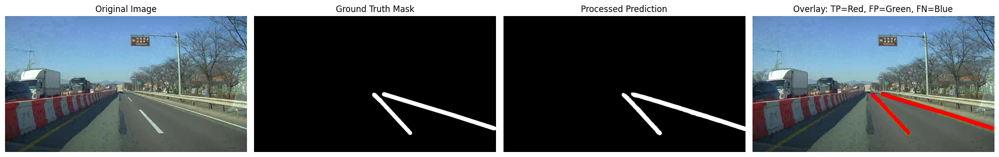

[시각화 중] /content/drive/MyDrive/1920_1080_image/15051500.jpg


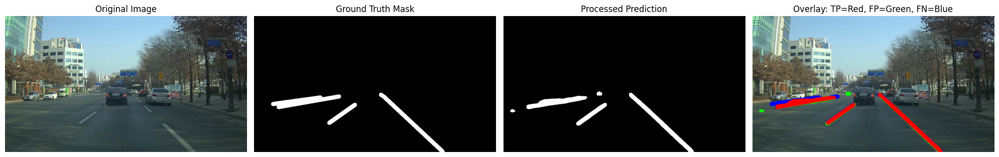

[시각화 중] /content/drive/MyDrive/1920_1080_image/15054506.jpg


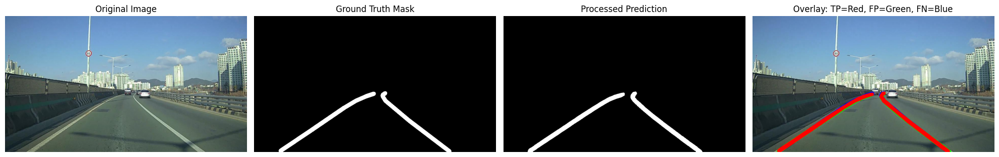

[시각화 중] /content/drive/MyDrive/1920_1080_image/15107894.jpg


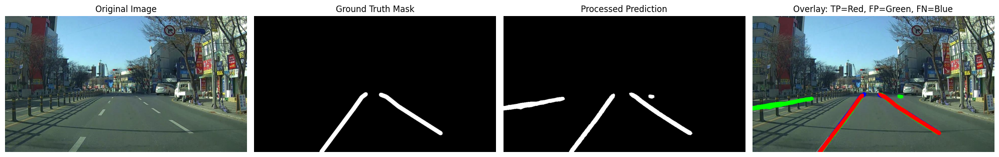

[시각화 중] /content/drive/MyDrive/1920_1080_image/14902531.jpg


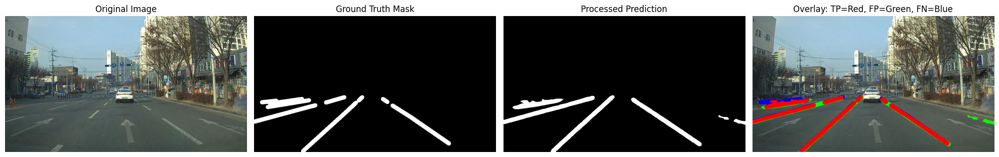

[시각화 중] /content/drive/MyDrive/1920_1080_image/15070867.jpg


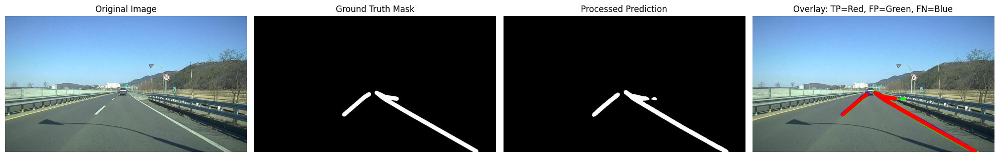

[시각화 중] /content/drive/MyDrive/1920_1080_image/15079472.jpg


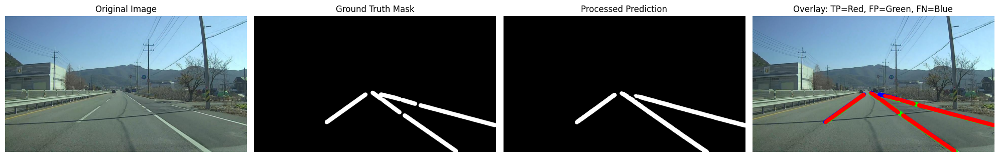

[시각화 중] /content/drive/MyDrive/1920_1080_image/15062417.jpg


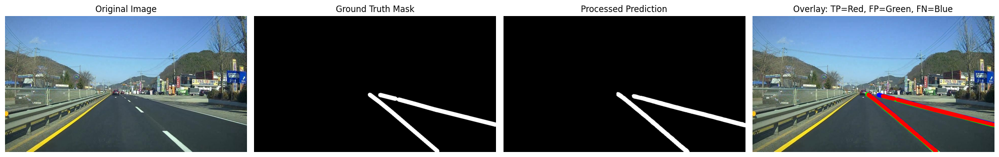

[시각화 중] /content/drive/MyDrive/1920_1080_image/15150937.jpg


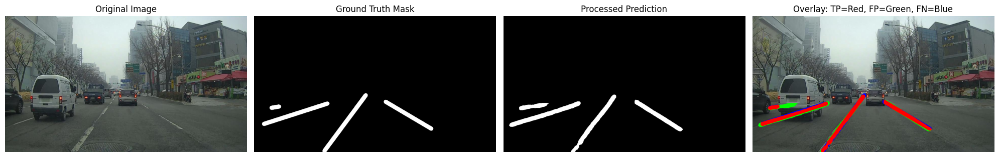

[시각화 중] /content/drive/MyDrive/1920_1080_image/15061997.jpg


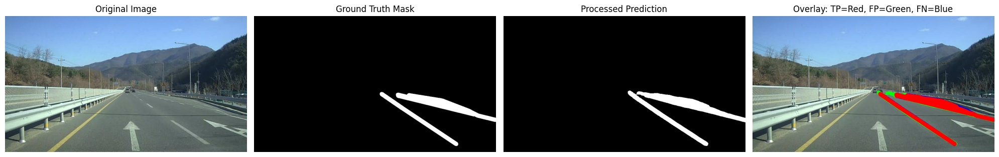

[시각화 중] /content/drive/MyDrive/1920_1080_image/14916850.jpg


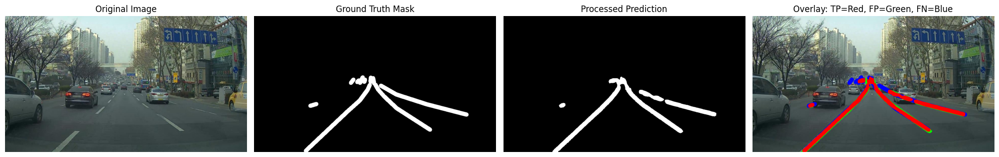

[시각화 중] /content/drive/MyDrive/1920_1080_image/15127085.jpg


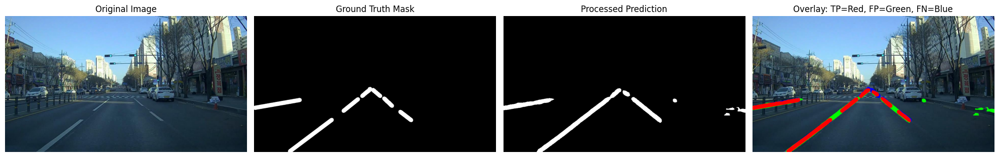

[시각화 중] /content/drive/MyDrive/1920_1080_image/15133844.jpg


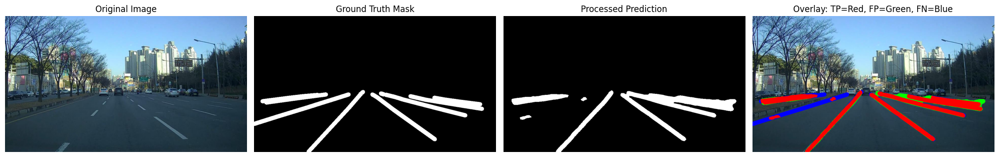

[시각화 중] /content/drive/MyDrive/1920_1080_image/15062077.jpg


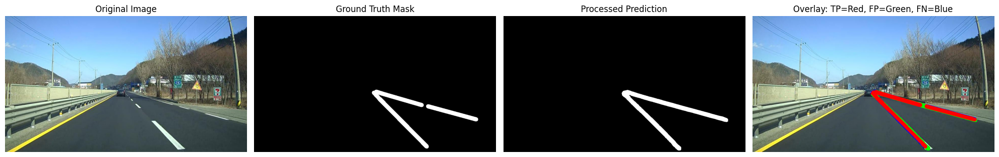

[시각화 중] /content/drive/MyDrive/1920_1080_image/15070318.jpg


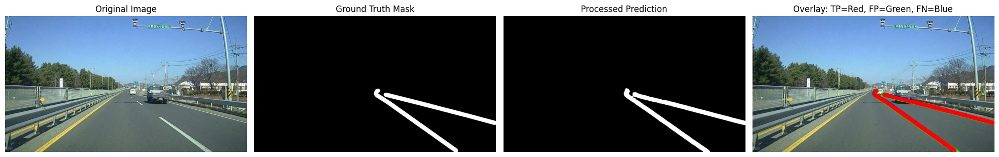

[시각화 중] /content/drive/MyDrive/1920_1080_image/15122750.jpg


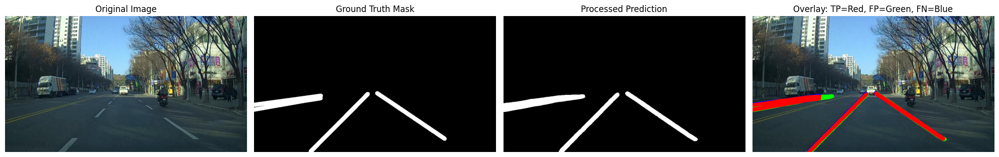

[시각화 중] /content/drive/MyDrive/1920_1080_image/15493794.jpg


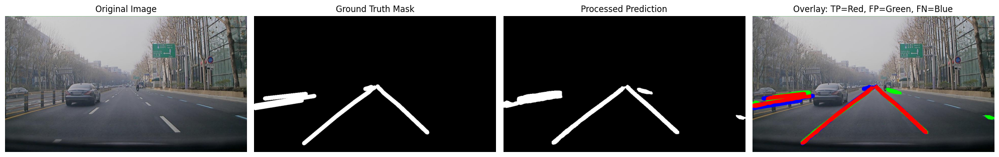

[시각화 중] /content/drive/MyDrive/1920_1080_image/15082778.jpg


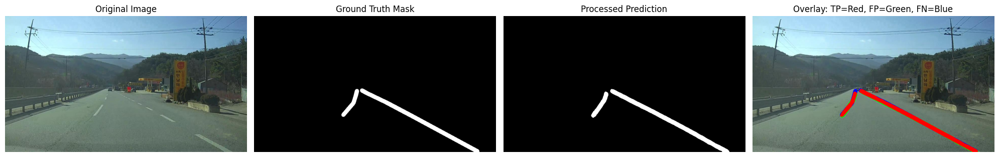

[시각화 중] /content/drive/MyDrive/1920_1080_image/13926745.jpg


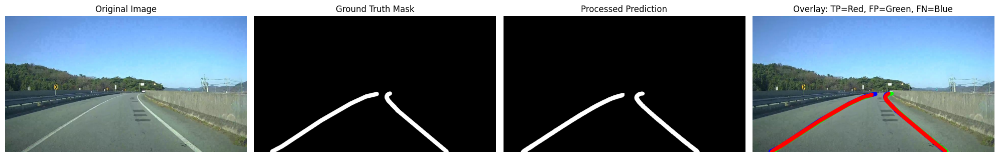

[시각화 중] /content/drive/MyDrive/1920_1080_image/15134407.jpg


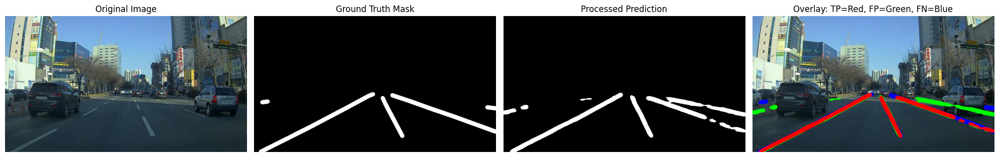

[시각화 중] /content/drive/MyDrive/1920_1080_image/15055513.jpg


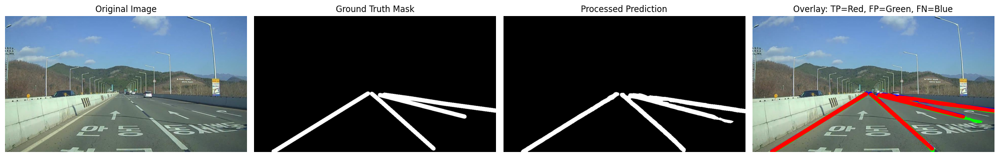

[시각화 중] /content/drive/MyDrive/1920_1080_image/15153240.jpg


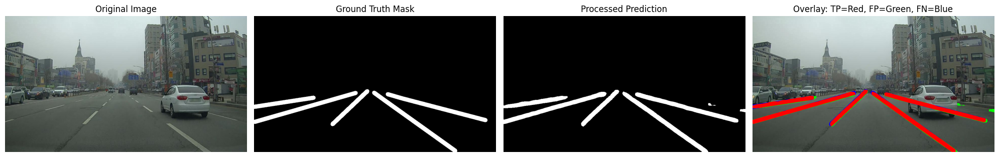

[시각화 중] /content/drive/MyDrive/1920_1080_image/15068977.jpg


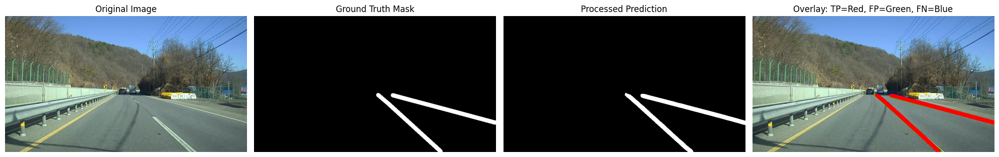

[시각화 중] /content/drive/MyDrive/1920_1080_image/15055658.jpg


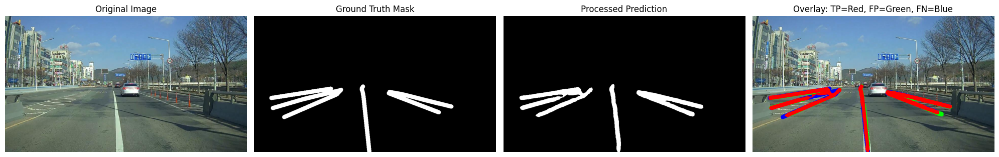

[시각화 중] /content/drive/MyDrive/1920_1080_image/15070570.jpg


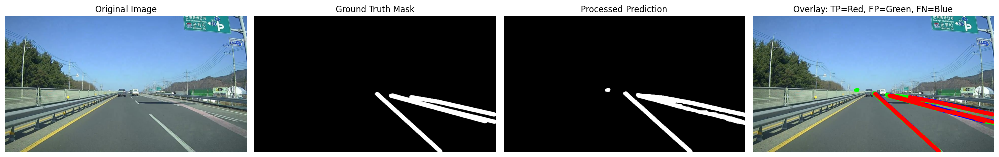

[시각화 중] /content/drive/MyDrive/1920_1080_image/13905755.jpg


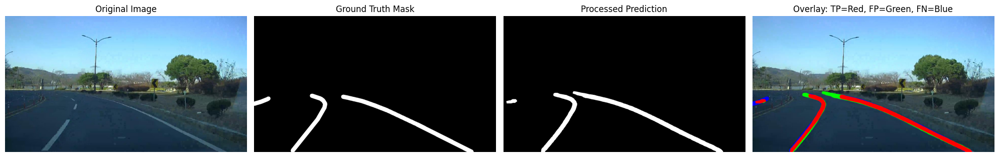

[시각화 중] /content/drive/MyDrive/1920_1080_image/15082788.jpg


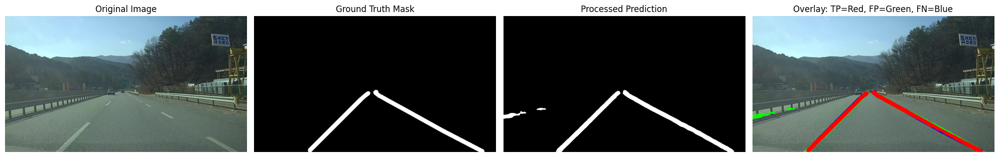

[시각화 중] /content/drive/MyDrive/1920_1080_image/15070878.jpg


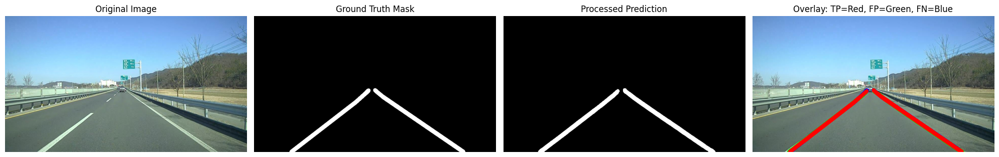

[시각화 중] /content/drive/MyDrive/1920_1080_image/15062062.jpg


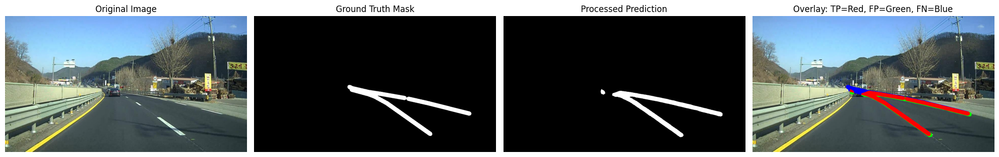

[시각화 중] /content/drive/MyDrive/1920_1080_image/15068512.jpg


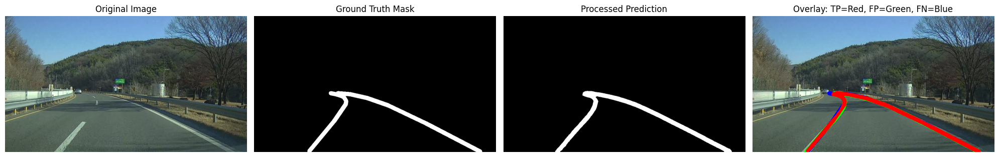

In [ ]:
import os
import glob
import random
import torch
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from torchvision import models, transforms
import cv2

# 모델 정의
# 평가/시각화용 모델 정의 + 불러오기
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=True)
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)
model_path = f"/content/drive/MyDrive/final_model_lr0.0001_bs4_ep15.pth"
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()
model.float()  # ✅ AMP 사용 시 꼭 필요함

# transform (정규화 제거)
viz_transform = transforms.Compose([
    transforms.Resize((540, 960)),
    transforms.ToTensor()
])

# 예측 및 시각화
def visualize_prediction_and_overlay(model, image_path, mask_path, save_prefix=""):
    # 이미지 준비
    image = Image.open(image_path).convert("RGB")
    input_resized = image.resize((960, 540))
    image_tensor = viz_transform(input_resized).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_tensor)["out"]
        softmax_probs = torch.softmax(output, dim=1)
        pred = (softmax_probs[:, 1, :, :] > 0.3).cpu().numpy().squeeze().astype(np.uint8)

    # 1. 경계 연결 (작은 커널 사용)
    kernel = np.ones((2, 2), np.uint8)  # 기존 3x3 or 7x7보다 작게
    pred = cv2.morphologyEx(pred, cv2.MORPH_CLOSE, kernel)

    # 2. 윤곽선 기반 중심 채우기
    contours, _ = cv2.findContours(pred, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 작은 윤곽선은 무시하고, 얇게 유지
    filled_pred = np.zeros_like(pred)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 100:  # 너무 얇거나 노이즈는 무시
            cv2.drawContours(filled_pred, [cnt], -1, 1, thickness=cv2.FILLED)

    pred = filled_pred

    # GT 마스크 준비
    gt_mask = Image.open(mask_path).convert("L").resize((960, 540))
    gt = (np.array(gt_mask) > 127).astype(np.uint8)

    # TP, FP, FN
    TP = (pred == 1) & (gt == 1)
    FP = (pred == 1) & (gt == 0)
    FN = (pred == 0) & (gt == 1)

    # 오버레이 이미지 만들기
    overlay = np.array(input_resized).copy()
    overlay[TP] = [255, 0, 0]    # 빨간색 (True Positive)
    overlay[FP] = [0, 255, 0]    # 초록색 (False Positive)
    overlay[FN] = [0, 0, 255]    # 파란색 (False Negative)

    # 🔽 prediction 마스크 저장
    pred_save_path = os.path.join("/content/drive/MyDrive/viz_prediction", f"{save_prefix}_pred.png")
    cv2.imwrite(pred_save_path, pred * 255)  # 0/1 → 0/255로

    # 🔽 원본 이미지 저장
    origin_save_path = os.path.join("/content/drive/MyDrive/viz_origin", f"{save_prefix}_origin.png")
    input_resized.save(origin_save_path)

    # 시각화
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(input_resized)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(gt, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(pred, cmap='gray')
    plt.title("Processed Prediction")
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(overlay)
    plt.title("Overlay: TP=Red, FP=Green, FN=Blue")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# ✅ 테스트셋 리스트에서 시각화
def visualize_multiple_predictions_from_test(model, file_list, image_dir, mask_dir, num_samples=10):
    selected_files = random.sample(file_list, min(num_samples, len(file_list)))

    for fname in selected_files:
        img_path = os.path.join(image_dir, fname)
        base_name = os.path.splitext(fname)[0]
        mask_path = os.path.join(mask_dir, f"{base_name}_mask.png")

        if not os.path.exists(mask_path):
            print(f"[경고] 마스크 없음: {img_path}")
            continue

        print(f"[시각화 중] {img_path}")
        visualize_prediction_and_overlay(model, img_path, mask_path, save_prefix=base_name)

print("▶ 테스트셋 기반 시각화 (30장)")
visualize_multiple_predictions_from_test(model, test_imgs, image_dir, mask_dir, num_samples=30)

In [ ]:
import sys
import torch
import torchvision

print("Python version:", sys.version)
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("CUDA version:", torch.version.cuda)
    print("GPU name:", torch.cuda.get_device_name(0))


Python version: 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]
PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA available: True
CUDA version: 12.4
GPU name: Tesla T4


In [ ]:
# @title
# import os
# import glob
# import random
# import torch
# import matplotlib.pyplot as plt
# from PIL import Image
# import numpy as np

# # 모델 구조 정의
# model = models.segmentation.deeplabv3_resnet101(pretrained=True)

# # 모델의 출력 클래스 수를 2로 설정
# model.classifier[4] = torch.nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1))

# # 모델 가중치 불러오기 (strict=False로 불일치 부분 무시)
# state_dict = torch.load("/content/drive/MyDrive/final_model.pth")

# # 출력 레이어만 제외한 가중치 로딩
# for key in list(state_dict.keys()):
#     if "classifier.4" in key:
#         del state_dict[key]

# model.load_state_dict(state_dict, strict=False)  # strict=False로 불일치 무시

# # 모델을 평가 모드로 설정
# model.eval()

# # 모델을 GPU로 올리기
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# def get_random_image_and_mask(image_dir, mask_dir):0
#     image_files = sorted(glob.glob(os.path.join(image_dir, '*.*')))
#     selected_image = random.choice(image_files)
#     image_name = os.path.basename(selected_image)
#     base_name = os.path.splitext(image_name)[0]
#     mask_name = f"{base_name}_mask.png"
#     mask_path = os.path.join(mask_dir, mask_name)

#     if not os.path.exists(mask_path):
#         raise FileNotFoundError(f"Mask not found for {selected_image}")

#     return selected_image, mask_path

# # Transform 적용
# transform = transforms.Compose([
#     transforms.Resize((720, 1080)),
#     transforms.ToTensor(),
# ])

# image_tensor = transform(image).unsqueeze(0).to(DEVICE)

# # 예측
# with torch.no_grad():
#     output = model(image_tensor)

# # 예측 결과에서 가장 높은 값의 클래스를 선택 (각 픽셀별로)
# predicted = torch.argmax(output['out'], dim=1).squeeze().cpu().numpy()

# # 원본 이미지 크기에 맞게 리사이즈
# resize_transform = transforms.Compose([
#     transforms.Resize((image.size[1], image.size[0]))  # 원본 이미지 크기로 리사이즈
# ])

# mask_resized = Image.fromarray(predicted.astype(np.uint8))
# mask_resized = resize_transform(mask_resized)
# mask_resized = np.array(mask_resized)

# # 시각화
# plt.figure(figsize=(10, 10))
# plt.subplot(1, 3, 1)
# plt.imshow(np.array(image))
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 3, 2)
# plt.imshow(mask_resized, cmap='tab20b')  # 예측된 마스크에 색상 맵 적용
# plt.title('Predicted Mask')
# plt.axis('off')

# # 오버레이
# plt.subplot(1, 3, 3)
# overlay = np.array(image).copy()

# # 예측된 마스크에서 차선(값이 255인 부분)을 찾아 흰색으로 오버레이
# overlay[mask_resized == 1] = [255, 255, 255]  # 차선 위치에 흰색 오버레이

# plt.imshow(overlay)
# plt.title('Overlay')
# plt.axis('off')

# plt.show()


In [ ]:
# @title
# import numpy as np
# import matplotlib.pyplot as plt
# import cv2
# from PIL import Image
# from torchvision import transforms
# import torch

# def predict_mask(model, image_path, device='cuda'):
#     model.eval()
#     image = Image.open(image_path).convert("RGB")

#     transform = transforms.Compose([
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet 기준
#                              std=[0.229, 0.224, 0.225])
#     ])

#     input_tensor = transform(image).unsqueeze(0).to(device)

#     with torch.no_grad():
#         output = model(input_tensor)
#         if output.shape[1] == 1:  # binary segmentation
#             pred = torch.sigmoid(output).squeeze().cpu().numpy()
#             pred_mask = (pred > 0.5).astype(np.uint8)
#         else:  # multi-class
#             pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

#     return np.array(image), pred_mask

# def visualize_detection_result(model, image_path, gt_mask_path, device='cuda'):
#     # Load prediction and image
#     image_np, pred_mask = predict_mask(model, image_path, device)

#     # Load ground truth mask
#     gt_mask = Image.open(gt_mask_path).convert("L")
#     gt_mask = np.array(gt_mask)
#     if gt_mask.max() > 1:
#         gt_mask = (gt_mask > 127).astype(np.uint8)  # binarize if needed

#     # TP, FP, FN 계산
#     TP = (pred_mask == 1) & (gt_mask == 1)
#     FP = (pred_mask == 1) & (gt_mask == 0)
#     FN = (pred_mask == 0) & (gt_mask == 1)

#     overlay = image_np.copy()

#     # 색 오버레이
#     overlay[TP] = [255, 0, 0]    # 빨간색
#     overlay[FP] = [0, 255, 0]    # 녹색
#     overlay[FN] = [0, 0, 255]    # 파란색

#     # 시각화
#     plt.figure(figsize=(18, 6))

#     plt.subplot(1, 4, 1)
#     plt.imshow(image_np)
#     plt.title("Original Image")
#     plt.axis('off')

#     plt.subplot(1, 4, 2)
#     plt.imshow(gt_mask, cmap='gray')
#     plt.title("Ground Truth Mask")
#     plt.axis('off')

#     plt.subplot(1, 4, 3)
#     plt.imshow(pred_mask, cmap='gray')
#     plt.title("Predicted Mask")
#     plt.axis('off')

#     plt.subplot(1, 4, 4)
#     plt.imshow(overlay)
#     plt.title("Overlay: TP(R) FP(G) FN(B)")
#     plt.axis('off')

#     plt.tight_layout()
#     plt.show()


In [ ]:
# @title
# import torch
# from torchvision import models
# import torch.nn as nn

# # ✅ 모델 구조 다시 선언 (pretrained 로!)
# model = models.segmentation.deeplabv3_resnet50(weights=models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT)
# model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)

# device = "cuda" if torch.cuda.is_available() else "cpu"
# model.load_state_dict(torch.load("/content/drive/MyDrive/final_model.pth", map_location=device))
# model = model.to(device)
# model.eval()

# print("✅ 모델 불러오기 완료!")


In [ ]:
# @title
# # @title 그리드 탐색 루프
# # ✅ 그리드 탐색 루프
# for lr, weight, bs in product(learning_rates, loss_weights, batch_sizes):
#     print(f"\n\n🚀 실험 시작: lr={lr}, weight={weight}, batch_size={bs}")

#     train_dataset = LaneDataset(image_dir, mask_dir, train_ids, transform)
#     val_dataset = LaneDataset(image_dir, mask_dir, val_ids, transform)

#     if len(train_dataset) == 0:
#         print("⚠️ 학습 데이터가 비어있어 건너뜁니다.")
#         continue

#     train_loader = DataLoader(train_dataset, batch_size=bs, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=bs)

#     model = models.segmentation.deeplabv3_resnet50(weights=models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT)
#     model.classifier[4] = nn.Conv2d(256, 2, kernel_size=1)

#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     model = model.to(device)

#     optimizer = torch.optim.Adam(model.parameters(), lr=lr)
#     loss_fn = nn.CrossEntropyLoss(weight=torch.tensor(weight, dtype=torch.float).to(device))

#     loss_history = []
#     num_epochs = 3

#     for epoch in range(num_epochs):
#         model.train()
#         total_loss = 0
#         for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
#             images, masks = images.to(device), masks.to(device)
#             outputs = model(images)["out"]
#             loss = loss_fn(outputs, masks)
#             optimizer.zero_grad()
#             loss.backward()
#             optimizer.step()
#             total_loss += loss.item()
#         avg_loss = total_loss / len(train_loader)
#         loss_history.append(avg_loss)
#         print(f"Epoch {epoch+1} - Loss: {avg_loss:.4f}")

#     # 결과 기록
#     results.append({
#         "lr": lr,
#         "weight": weight,
#         "batch_size": bs,
#         "loss_history": loss_history
#     })

# # ✅ 전체 실험 후 그래프 출력 및 최적 조합 찾기 (평균 loss 기준)
# import matplotlib.pyplot as plt
# import numpy as np

# plt.figure(figsize=(10, 6))
# for result in results:
#     lr = result["lr"]
#     weight = result["weight"]
#     bs = result["batch_size"]
#     loss_history = result["loss_history"]
#     label = f"lr={lr}, w={weight[0]}/{weight[1]}, bs={bs}"
#     plt.plot(range(1, len(loss_history)+1), loss_history, label=label)

# plt.xlabel("Epoch")
# plt.ylabel("Loss")
# plt.title("Loss Comparison for Hyperparameter Combinations")
# plt.legend(fontsize="small")
# plt.tight_layout()
# plt.savefig("loss_comparison_all.png")
# plt.show()

# # 평균 loss 기준 최적 조합 찾기
# best_result = min(results, key=lambda x: np.mean(x["loss_history"]))
# mean_loss = np.mean(best_result["loss_history"])

# print("✅ 최적 조합 (평균 loss 기준):")
# print(f"lr = {best_result['lr']}")
# print(f"weight = {best_result['weight']}")
# print(f"batch_size = {best_result['batch_size']}")
# print(f"평균 loss = {mean_loss:.4f}")